# Calculate velocity distribution and position destribution of MDCK on gel  

Data  
Flow off, acoustic off:   
Flow on, acoustic off:  
Flow off, acous on:  
Flow on, acoustic on: 
Use only one measurement  
Use only frame 0 to 360

## Libraries

In [2]:
import glob
import os
import re

import numpy as np
import pandas as pd

from skimage.io import imread, imshow
from skimage.filters import median, gaussian
from skimage.transform import rotate

import trackpy as tp

import matplotlib.pyplot as plt
import seaborn as sns

import pickle

## Functions

In [1]:
def make_dataset(acoustic, hydro, measurement, start_frame=0, end_frame=360):
    imgs = [os.path.abspath(p) for p in glob.glob(f'../2D/data/id553_acoustic-{acoustic}_flow-{hydro}_{measurement}*_*.tif')]
    imgs = sorted(imgs, key = lambda x : re.search(r'_00[0-9][0-9][0-9].', x).group())
    imgs = imgs[start_frame:end_frame]
    imgs = [imread (img) for img in imgs]
    
    return imgs

def clip(img, bounds=(None, None)):
    return img[bounds[0]:bounds[1], :]

def filter_img(img):
    filtered_img = median(img)
    filtered_img = gaussian(filtered_img, sigma=1)
    return filtered_img

def process(imgs, bounds=(None, None)):
    filtered_imgs = [filter_img(clip(np.fliplr(img), bounds=bounds)) for img in imgs]
    return filtered_imgs

def test(acoustic, hydro, measurement, end_frame=20, wall_up=230, threshold=20/255):
    imgs = make_dataset(acoustic, hydro, measurement, end_frame=end_frame)
    imgs = process(imgs, bounds=(wall_up, wall_up+1124))
    locations = tp.batch(imgs, diameter=25, threshold=threshold)
    pred = tp.predict.ChannelPredict(110, 'x', minsamples=10)
    track = pred.link_df(locations, search_range=[13, 40], memory=10)
    track = tp.filter_stubs(track, 5)
    
    fig, axes = plt.subplots(2, 1, figsize=(20, 10))
    tp.annotate(locations[locations['frame']==0], imgs[0], ax=axes[0])
    tp.plot_traj(track)

def analysis(acoustic, hydro, measurement, bounds=(None, None), threshold=20/255):
    imgs = make_dataset(acoustic, hydro, measurement)
    imgs = process(imgs, bounds)
    locations = tp.batch(imgs, diameter=25, threshold=threshold)
    pred = tp.predict.ChannelPredict(110, 'x', minsamples=10)
    track = pred.link_df(locations, search_range=[13, 40], memory=10)
    track = tp.filter_stubs(track, 120)
    imsd = tp.motion.imsd(track, mpp=1/1.124, fps=40, max_lagtime=360)
    print('The number of detected tracks is:', len(imsd.columns))
        
    return track, imsd

# Test

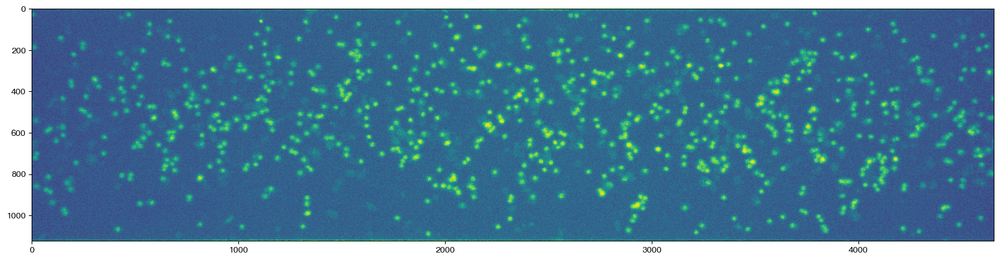

In [5]:
img = imread('/media/data1/minato/3d/id553/data/id553_acoustic-off_flow-off_1*_00001.tif')
plt.figure(figsize=(20, 10))
plt.imshow(img[208:208+1124, :])

Frame 19: 638 trajectories present.


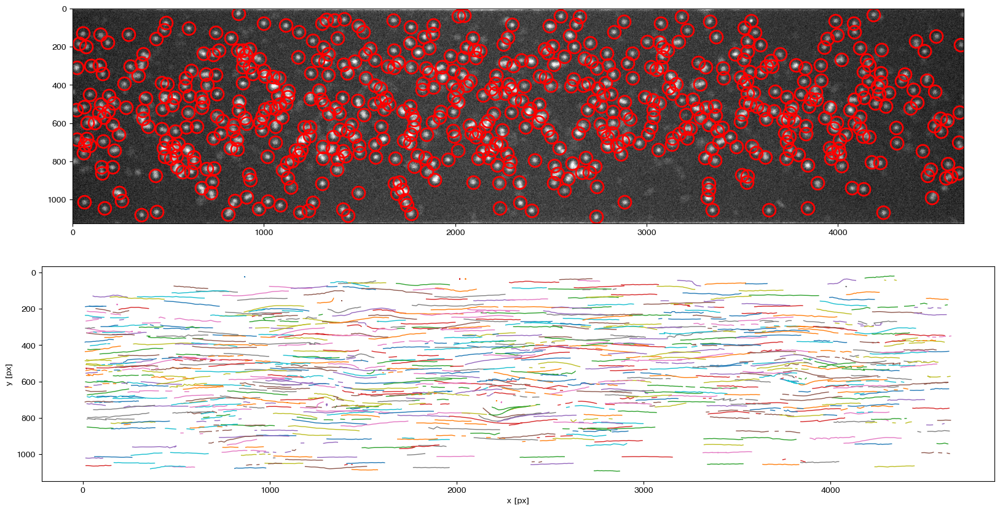

In [6]:
test('off', 'off', measurement=1, wall_up=208)

Frame 19: 382 trajectories present.


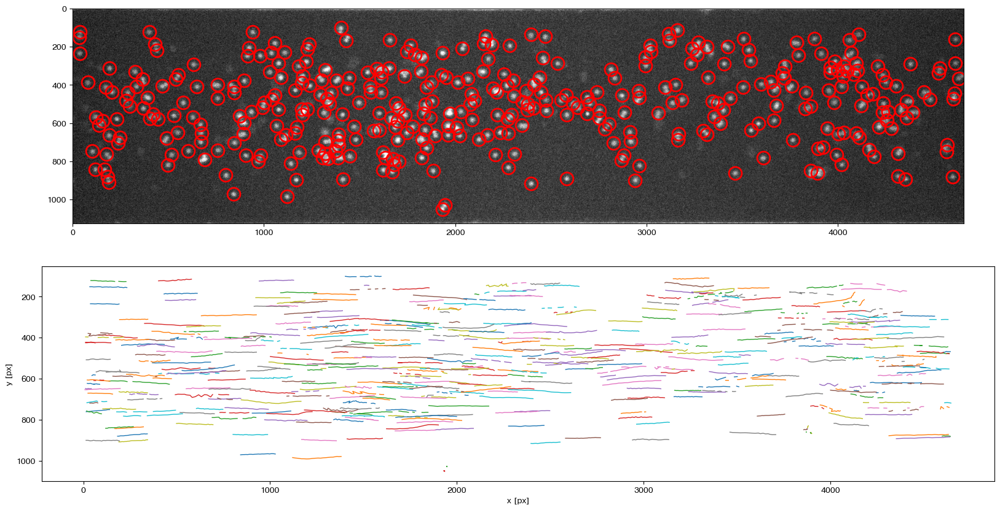

In [7]:
test('off', 'on', measurement=1, wall_up=208)

Frame 19: 759 trajectories present.


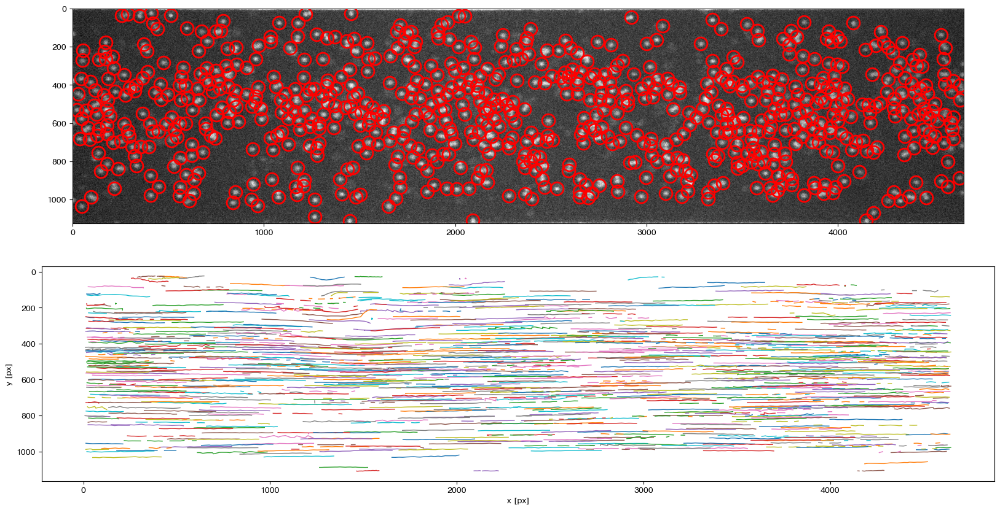

In [8]:
test('on', 'off', measurement=1, wall_up=208)

Frame 19: 374 trajectories present.


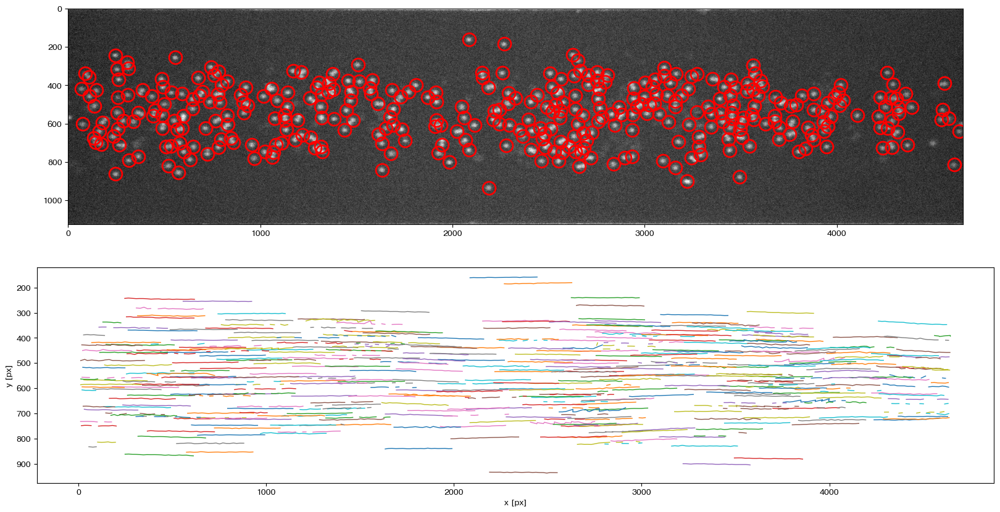

In [9]:
test('on', 'on', measurement=1, wall_up=208)

## Analysis

### Acoustic: on & Flow: on

In [28]:
wall_up = 208
wall_bottom = wall_up + 1124

In [29]:
on_on_track, on_on_imsd = analysis(acoustic='on', hydro='on', measurement=1, bounds=(wall_up, wall_bottom))

Frame 359: 375 trajectories present.
The number of detected tracks is: 522


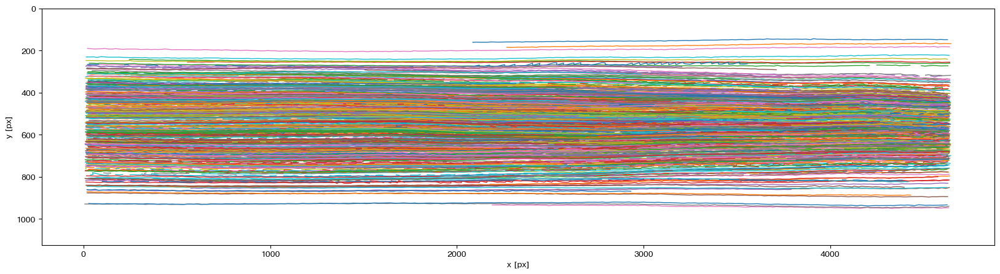

<Axes: xlabel='x [px]', ylabel='y [px]'>

In [30]:
plt.figure(figsize=(20, 5))
plt.ylim(0, 1124)
tp.plot_traj(on_on_track)

In [31]:
on_on_imsd.to_csv('../result/id553_on_on_1_imsd.csv')
with open('../result/id553_on_on_1_track.txt', 'wb') as f:
    pickle.dump(on_on_track, f)

### Acoustic: on & Flow: off

In [32]:
wall_up = 208
wall_bottom = wall_up + 1124

In [33]:
on_off_track, on_off_imsd = analysis(acoustic='on', hydro='off', measurement=1, bounds=(wall_up, wall_bottom))

Frame 359: 812 trajectories present.
The number of detected tracks is: 1128


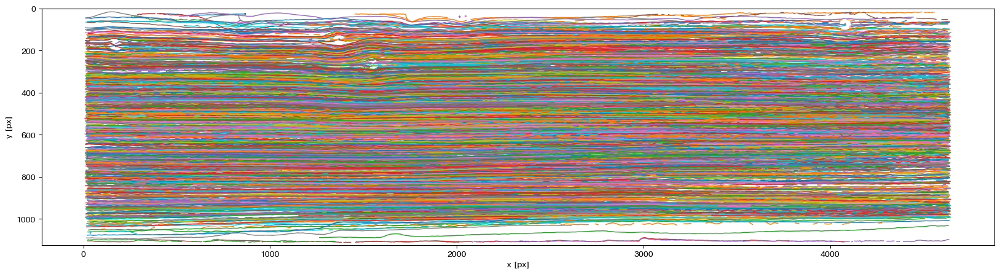

<Axes: xlabel='x [px]', ylabel='y [px]'>

In [34]:
plt.figure(figsize=(20, 5))
plt.ylim(0, 1124)
tp.plot_traj(on_off_track)

In [35]:
on_off_imsd.to_csv('../result/id553_on_off_1_imsd.csv')
with open('../result/id553_on_off_1_track.txt', 'wb') as f:
    pickle.dump(on_off_track, f)

### Acoustic: off & Flow: off

In [38]:
wall_up = 208
wall_bottom = wall_up + 1124

In [39]:
off_off_track, off_off_imsd = analysis(acoustic='off', hydro='off', measurement=1, bounds=(wall_up, wall_bottom))

Frame 359: 680 trajectories present.
The number of detected tracks is: 753


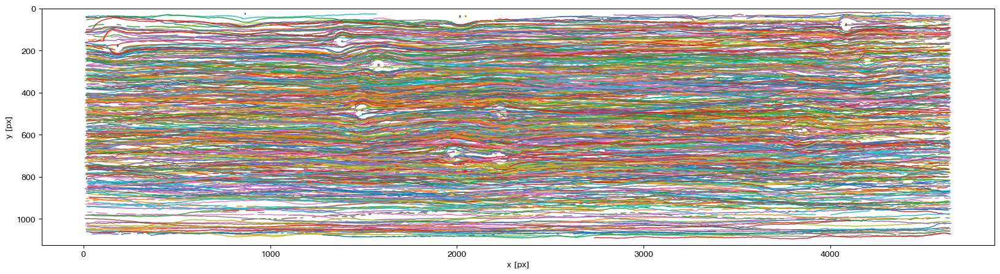

<Axes: xlabel='x [px]', ylabel='y [px]'>

In [40]:
plt.figure(figsize=(20, 5))
plt.ylim(0, 1124)
tp.plot_traj(off_off_track)

In [41]:
off_off_imsd.to_csv('../result/id553_off_off_1_imsd.csv')
with open('../result/id553_off_off_1_track.txt', 'wb') as f:
    pickle.dump(off_off_track, f)

### Acoustic: off & Flow: on

In [42]:
wall_up = 208
wall_bottom = wall_up + 1124

In [43]:
off_on_track, off_on_imsd = analysis(acoustic='off', hydro='on', measurement=1, bounds=(wall_up, wall_bottom))

Frame 359: 466 trajectories present.
The number of detected tracks is: 463


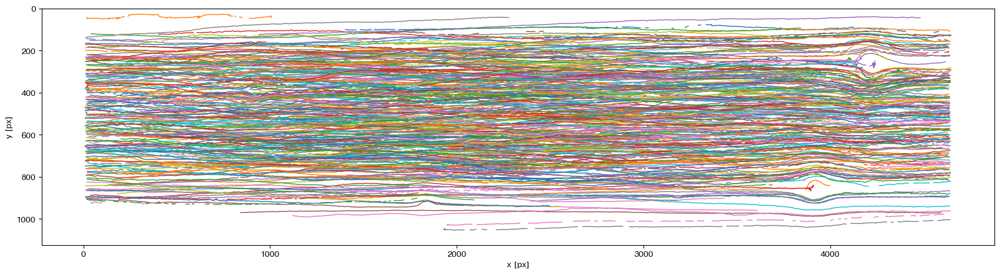

<Axes: xlabel='x [px]', ylabel='y [px]'>

In [44]:
plt.figure(figsize=(20, 5))
plt.ylim(0, 1124)
tp.plot_traj(off_on_track)

In [45]:
off_on_imsd.to_csv('../result/id553_off_on_1_imsd.csv')
with open('../result/id553_off_on_1_track.txt', 'wb') as f:
    pickle.dump(off_on_track, f)